

---

## ❌ Why Linear Regression Fails in Binary Classification

* **Predicts continuous values** (e.g., -2.5, 4.3), not class labels (0 or 1).
* **No output bounds** — results can go below 0 or above 1.
* **Not probabilistic** — can't interpret output as a probability.
* **Sensitive to outliers**, leading to poor classification boundaries.
* **Assumes linear relationship**, which doesn't fit binary outcomes.

👉 Use **Logistic Regression** instead — it gives outputs between 0 and 1 using the sigmoid function and is designed for classification.

---



# What is Logistic Regression?
It’s a classification algorithm, that is used where the response variable is categorical. The idea of Logistic Regression is to find a relationship between features and probability of particular outcome.

E.g. When we have to predict if a student passes or fails in an exam when the number of hours spent studying is given as a feature, the response variable has two values, pass and fail.

This type of a problem is referred to as Binomial Logistic Regression, where the response variable has two values 0 and 1 or pass and fail or true and false. Multinomial Logistic Regression deals with situations where the response variable can have three or more possible values.

# Types of Logistic Regression: 
## Binary Logistic Regression:
The dependent variable has only two 2 possible outcomes/classes. 
Example-Male or Female.
## Multinomial Logistic Regression:
The dependent variable has only two 3 or more possible outcomes/classes without ordering. 
Example: Predicting food quality.(Good,Great and Bad).
## Ordinal Logistic Regression: 
The dependent variable has only two 3 or more possible outcomes/classes with ordering. 
Example: Star rating from 1 to 5

# Perceptron trick for Logistic Regression 

---

1. The **Perceptron Trick** is used to update the decision boundary in a linear classifier.
2. It helps correct **misclassified** points by adjusting the weight vector.
3. The update rule is:
   $\mathbf{w} = \mathbf{w} + \eta (y_i - \hat{y}_i) \cdot \mathbf{x}_i$
4. $y_i$ is the true label, $\hat{y}_i$ is the predicted label (0 or 1).
5. $\eta$ is the learning rate, and $\mathbf{x}_i$ is the input vector.
6. If a point is correctly classified, no update is made.
7. If misclassified, the boundary moves toward the correct side.
8. This process repeats until all points are correctly classified (if possible).
9. It only works well for **linearly separable** data.
10. The Perceptron Trick forms the basis of many modern learning algorithms.

---


# Code for Perceptron trick

In [10]:
import matplotlib.pyplot as plt


In [12]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

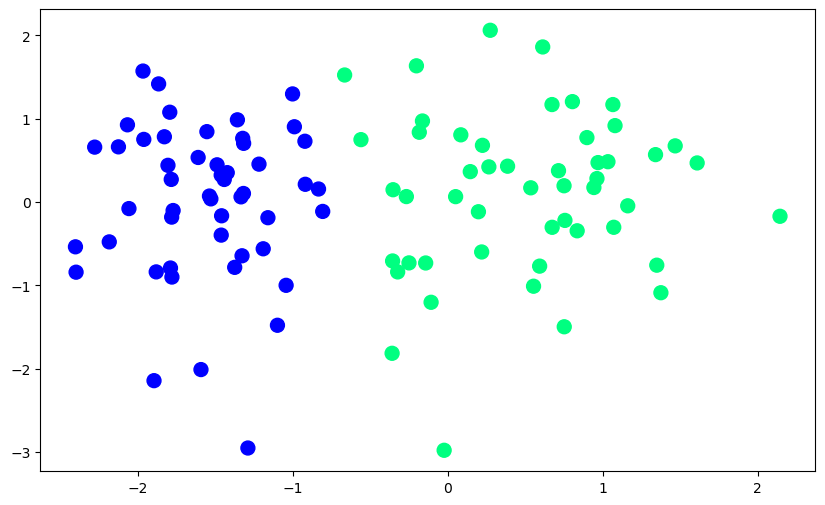

In [16]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.show()

In [18]:
def perceptron(X,y):
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
    return weights[0],weights[1:]

In [20]:
def step(z):
    return 1 if z>0 else 0

In [22]:
intercept_,coef_ = perceptron(X,y)


In [24]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [26]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

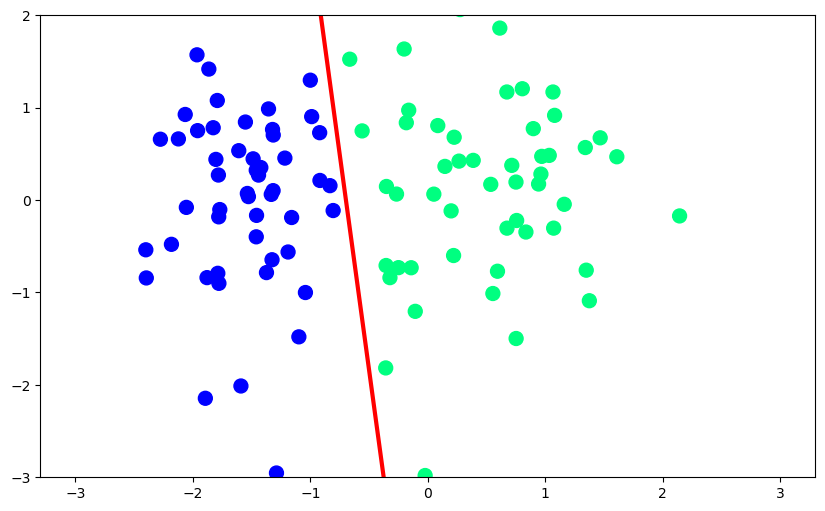

In [28]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [30]:
def perceptron(X,y):
    
    m = []
    b = []
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
        
    return m,b

In [32]:
m,b = perceptron(X,y)

In [42]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from IPython.display import HTML

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Example data — replace with your actual m, b, X, y
X = np.random.randn(100, 2)
y = (X[:, 0] + X[:, 1] > 0).astype(int)
m = np.linspace(-1, 1, 200)  # 200 different slopes
b = np.linspace(0, 1, 200)   # 200 different intercepts

# Plot setup
fig, ax = plt.subplots(figsize=(9, 5))
x_i = np.arange(-3, 3, 0.1)
line, = ax.plot(x_i, x_i * m[0] + b[0], 'r-', linewidth=2)
ax.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
plt.ylim(-3, 3)

# Update function for animation
def update(i):
    line.set_ydata(x_i * m[i] + b[i])  # update the line
    ax.set_xlabel(f"epoch {i + 1}")    # update epoch label
    return line,

# Create animation
anim = FuncAnimation(fig, update, frames=len(m), interval=100, blit=True)

# Display inline in JupyterLab
HTML(anim.to_jshtml())


<IPython.core.display.Javascript object>

# Sigmoid function



The **Sigmoid function**, also known as the **logistic function**, transforms any real-valued number into a number between **0 and 1**. It is commonly used in **Logistic Regression** to represent probabilities.

### ✅ Mathematical Formula:

$$
\sigma(z) = \frac{1}{1 + e^{-z}}
$$

Where:

* $z$ is the input (often a linear combination of features: $z = w_0 + w_1x_1 + \dots + w_nx_n$)
* $e$ is Euler’s number (\~2.718)

---

### 📌 Intuition Behind the Sigmoid Function

The sigmoid function gives an **S-shaped curve** that can take any real-valued number and map it into a value between **0 and 1**.

* As the input approaches **positive infinity**, the output approaches **1** → interpreted as **class 1** (YES).
* As the input approaches **negative infinity**, the output approaches **0** → interpreted as **class 0** (NO).
* When the output is exactly **0.5**, the model is uncertain (e.g., 50% chance of YES).

> If the output of the sigmoid function is **more than 0.5**, we classify the outcome as **1 (YES)**.
> If it's **less than 0.5**, we classify it as **0 (NO)**.

### 🎯 Example:

> Suppose the sigmoid output is **0.75**. This means there is a **75% probability** that the patient will suffer from cancer. Since 0.75 > 0.5, we classify the outcome as **Yes** (class 1).

---



In [79]:
import numpy as np
import matplotlib.pyplot as plt

# Define the sigmoid function
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Generate input values
z = np.linspace(-10, 10, 1000)
sigmoid_values = sigmoid(z)

# Plotting the sigmoid function
plt.figure(figsize=(8, 5))
plt.plot(z, sigmoid_values, label="Sigmoid Curve", color="blue")
plt.axhline(y=0.5, color='gray', linestyle='--', label='Threshold = 0.5')
plt.axvline(x=0, color='red', linestyle='--', label='z = 0')
plt.title("Sigmoid Function (Logistic Curve)")
plt.xlabel("Input z")
plt.ylabel("Output σ(z)")
plt.grid(True)
plt.legend()
plt.show()


<IPython.core.display.Javascript object>

# Cost Function for Logistic Regeression 

$$
\boxed{
J(\theta) = -\frac{1}{m} \sum_{i=1}^{m} \left[ y_i \cdot \log(\hat{y}_i) + (1 - y_i) \cdot \log(1 - \hat{y}_i) \right]
}
$$

**Where:**

* $J(\theta)$ = cost function (to minimize)
* $m$ = number of training examples
* $y_i$ = actual label for example $i$ (0 or 1)
* $\hat{y}_i$ = predicted probability for example $i$, i.e., output of the sigmoid function
Sure! Here’s a brief introduction to $\hat{y}$ (y-hat) that you can use alongside the cost function:


$$
\hat{y} = \sigma(z) = \frac{1}{1 + e^{-z}}
$$

where

$$
z = \theta^T x = \theta_0 + \theta_1 x_1 + \theta_2 x_2 + \dots + \theta_n x_n
$$

* $x$ is the input feature vector
* $\theta$ is the parameter vector (weights and bias)
* $\hat{y}$ ranges between 0 and 1, representing a probability
---

